In [1]:
%load_ext autoreload
%autoreload 2
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import glob
import time
import sklearn
import skimage
from sklearn.svm import LinearSVC
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split    
from lesson_functions import *

# NOTE: the next import is only valid for scikit-learn version <= 0.17
# for scikit-learn <= 0.18 use:
#from sklearn.cross_validation import train_test_split
   
# Read in cars and notcars
cars = glob.glob('data/vehicles/**/*.png', recursive=True)
notcars = glob.glob('data/non-vehicles/**/*.png', recursive=True)

print('The scikit-learn version is {} and the scikit-image version is {}.'.format(sklearn.__version__,skimage.__version__))
print('found %d cars' % len(cars))
print('found %d non-cars' % len(notcars))

The scikit-learn version is 0.19.1 and the scikit-image version is 0.14.0.
found 8792 cars
found 8968 non-cars


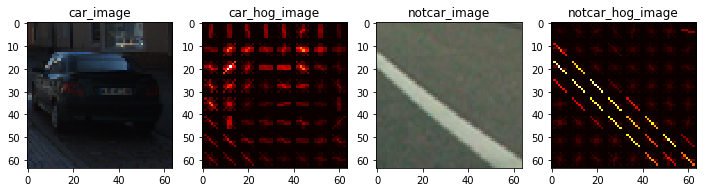

In [2]:
%matplotlib inline

car_ind = np.random.randint(0, len (cars))
notcar_ind = np.random.randint(0, len (notcars))
car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 6 # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block; normalization nxn cells
hog_channel = 0 # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 16    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
block_norm = 'L2-Hys' #'L1'

car_features,car_hog_image = single_img_features(car_image, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, block_norm=block_norm,
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat,vis=True)

notcar_features,notcar_hog_image = single_img_features(notcar_image, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, block_norm=block_norm,
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat,vis=True)

images = [car_image,car_hog_image, notcar_image,notcar_hog_image]
titles = ['car_image','car_hog_image', 'notcar_image','notcar_hog_image']

fig = plt.figure(figsize=(12,3))#, dpi=80
visualize(fig,1,4,images,titles)


In [3]:
from sklearn.svm import SVC
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

color_space = 'YCrCb' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 9 # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = 'ALL' # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off
block_norm = 'L2-Hys' #'L1'

t=time.time()
# Reduce the sample size by dividor -div
div = 1
sample_size = len (cars)//div
random_indexs = np.random.randint(0, len (cars),sample_size)
test_cars = np.array(cars)[random_indexs]
test_notcars = np.array(notcars)[random_indexs]# notcars are more

car_features = extract_features(test_cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, block_norm=block_norm, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(test_notcars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, block_norm=block_norm,
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

print(round(time.time()-t, 2), 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
# Fit a per-column scaler
X_scaler = StandardScaler().fit(X)
# Apply the scaler to X
scaled_X = X_scaler.transform(X)

# Define the labels vector
y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


# Split up data into randomized training and test sets
rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.1, random_state=rand_state)

print('Using:',orient,'orientations,',pix_per_cell,
    'pixels per cell,', cell_per_block,'cells per block,\n',
     hist_bins,'histogram bins, and', spatial_size,'spatial sampling')
print('Feature vector length:', len(X_train[0]))

# parameters for GridSearchCV
parameters = {'kernel':('linear', 'rbf'),'C':[1, 10]}
svr = SVC() # svc = LinearSVC()
# apply GridSearchCV for better results
clf = GridSearchCV(svr, parameters)

# Check the training time for the SVC
t=time.time()
clf.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train clf...')

# Check the score of the SVC clf.best_params_.
print('Test Accuracy of clf = ', round(clf.score(X_test, y_test),5))


142.7 Seconds to compute features...
Using: 9 orientations, 8 pixels per cell, 2 cells per block,
 32 histogram bins, and (32, 32) spatial sampling
Feature vector length: 8460
3795.33 Seconds to train clf...
Test Accuracy of clf =  0.99773


test_images/test6.jpg 0.0 1.0
14.580516338348389 Seconds to process one image searching 544 windows
test_images/test5.jpg 0.0 1.0
14.52135968208313 Seconds to process one image searching 544 windows
test_images/test3.jpg 0.0 1.0
14.52391767501831 Seconds to process one image searching 544 windows
test_images/test4.jpg 0.0 1.0
14.484775066375732 Seconds to process one image searching 544 windows
test_images/test2.jpg 0.0 1.0
14.605154991149902 Seconds to process one image searching 544 windows
test_images/test1.jpg 0.0 1.0
14.540423393249512 Seconds to process one image searching 544 windows


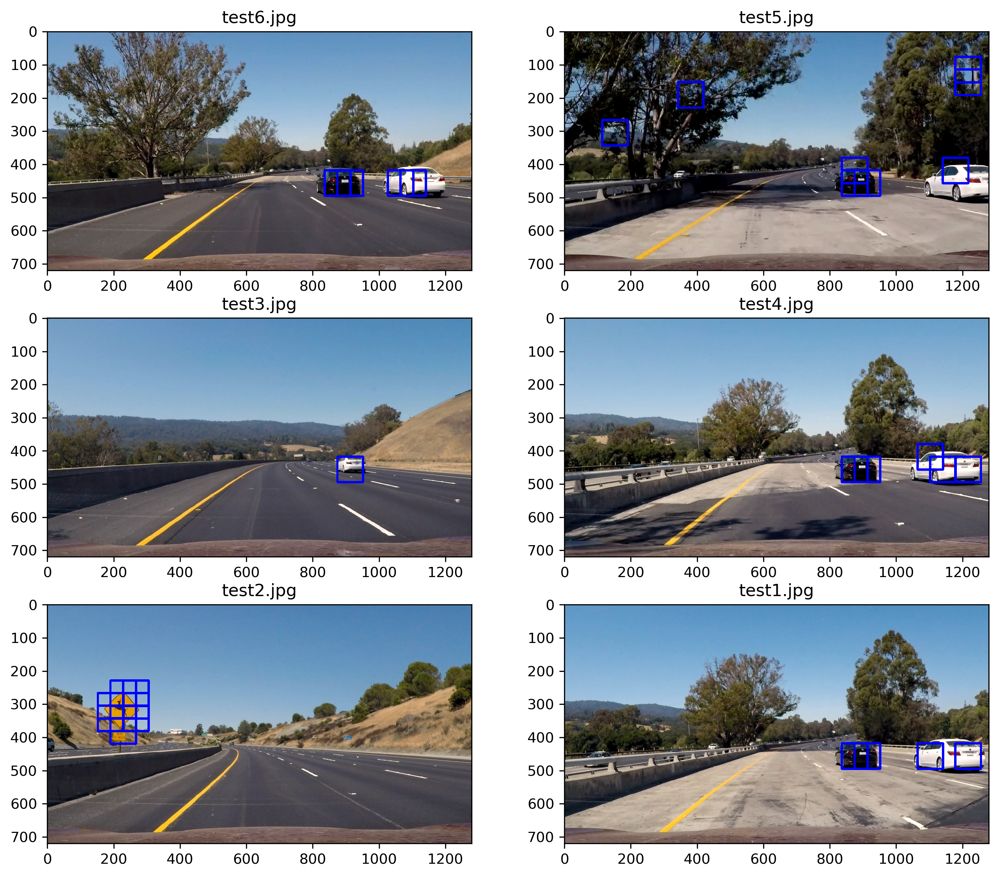

In [4]:
example_images = glob.glob('test_images/*.jpg')
images =[]
titles = []
y_start_stop = [0, 700] # Min and max in y to search in slide_window()                
overlap = 0.5
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img =np.copy(img)
    img = img.astype(np.float32)/255
    print (img_src,np.min(img), np.max(img))

    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop, 
                    xy_window=(77, 77), xy_overlap=(overlap, overlap))

    hot_windows = search_windows(img, windows, clf, X_scaler, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, block_norm =block_norm,
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)                       

    window_img = draw_boxes(draw_img,hot_windows,color=(0,0,255),thick=6)                           
    images.append(window_img)
    titles.append(img_src[-9:])
    print(time.time()-t1, 'Seconds to process one image searching', len(windows),'windows')
fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig,5,2,images,titles)


7.739671230316162 Seconds to run, total windows =  378
7.685646295547485 Seconds to run, total windows =  378
7.7007293701171875 Seconds to run, total windows =  378
7.703184604644775 Seconds to run, total windows =  378
7.6890411376953125 Seconds to run, total windows =  378
7.700026750564575 Seconds to run, total windows =  378


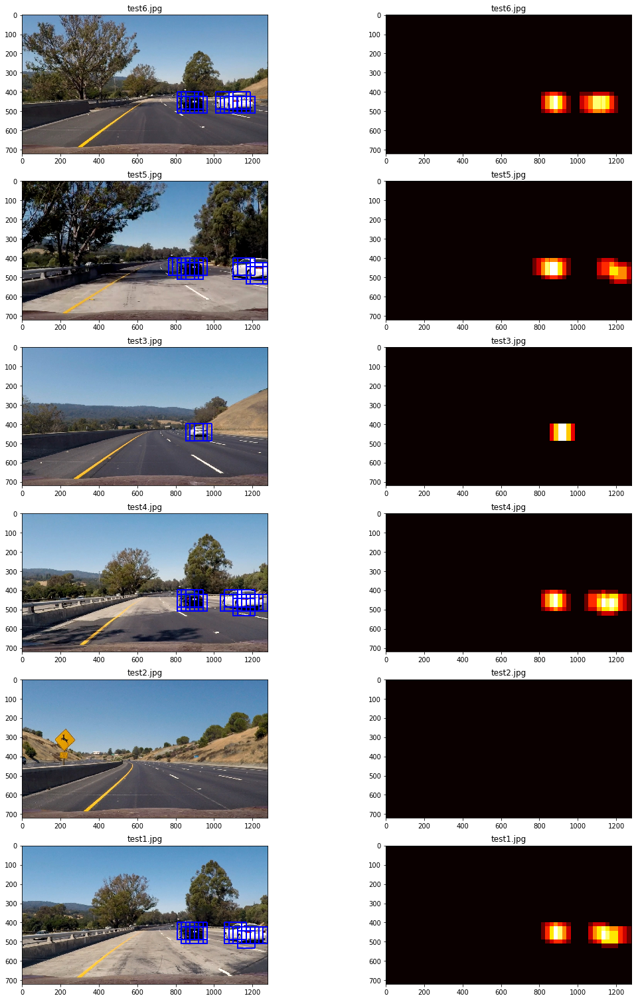

In [5]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []
# considder a narrower swath in y
ystart = 400
ystop = 656
scale = 1.4
# Iterate over the test images
for img_src in example_images:
    img_boxes = []
    t=time.time()
    count=0
    img = mpimg.imread(img_src)
    draw_img =np.copy(img)
    # make a heat_map of zeros
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
      
    img_tosearch = img[ystart:ystop,:,:]# no restictin in x -direction => empty only ":,:"
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, block_norm, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, block_norm, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, block_norm, feature_vec=False)
    
    for xb in range(nxsteps+1):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop  = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.concatenate((spatial_features, hist_features, hog_features)).reshape(1, -1))   
            test_prediction = clf.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] +=1
    
    print(time.time()-t,'Seconds to run, total windows = ', count)
    
    out_images.append(draw_img)
          
    out_titles.append(img_src[-9:])
    out_titles.append(img_src[-9:])
    #heatmap...
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(heatmap)
          
fig = plt.figure(figsize=(18,36))
visualize(fig,8,2,out_images,out_titles)
          

In [6]:
def find_cars(img, scale):
    
    draw_img =np.copy(img)
    # make a heat_map of zeros one chanel
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
      
    img_tosearch = img[ystart:ystop,:,:]# no restictin in x -direction => empty only ":,:"
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, block_norm, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, block_norm, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, block_norm, feature_vec=False)
    
    for xb in range(nxsteps+1):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))

            xleft = xpos*pix_per_cell
            ytop  = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            # Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.concatenate((spatial_features, hist_features, hog_features)).reshape(1, -1))   
            test_prediction = clf.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                img_boxes.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] +=1
    return draw_img, heatmap
   

In [7]:
# toolbox
from scipy.ndimage.measurements import label

def appley_threshold(heatmap, threshold):
    heatmap[heatmap<= threshold] =0
    return heatmap

def draw_labeled_bboxes(img, labels, color = (0,0,255)):
    for car_number in range(1, labels[1]+1):
        # find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # indentify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox),np.min(nonzeroy)),(np.max(nonzerox),np.max(nonzeroy)))
        # drw bbox
        cv2.rectangle(img, bbox[0], bbox[1] ,color ,6)
    return img

In [8]:
def process_image_lanes(img, heat_map ,index , keep_state=True):
    """
    Apply whole lane detection pipeline to an input color frame.
    :param frame: input color frame
    :param keep_state: if True, lane-line state is conserved (this permits to average results)
    :return: output blend with detected lane overlaid
    """
    # undistored the images
    img_undistorted = cv2.undistort(img,mtx,dist,None,mtx) 
    
    # binarize the frame s.t. lane lines are highlighted as much as possible
    img_binary = binarize(img_undistorted)
  
    # prespectiv transformation area to obtain bird's eye view
    warped, M, M_inv = warper(img_binary)
   
    # give the birdview image to the tracker object
    window_centroids, curve_rad = curve_centers.find_window_centroids(warped)
    
    # start tracker return debug image and line coordinates
    debug = curve_centers.get_tracker_results(warped, window_centroids)
 
    # fit the lane boundaries to the left, right center positions found
    yvals = range(0,warped.shape[0])
    res_yvals = np.arange(warped.shape[0]-(curve_centers.window_height/2),0,-curve_centers.window_height)

    left_fit  = np.polyfit(res_yvals, window_centroids[:,0],2)
    left_fitx = left_fit[0]*yvals*yvals + left_fit[1]*yvals+ left_fit[2]
    left_fitx = np.array(left_fitx,np.int32)
 
    right_fit  = np.polyfit(res_yvals, window_centroids[:,1],2)
    right_fitx = right_fit[0]*yvals*yvals + right_fit[1]*yvals+ right_fit[2]
    right_fitx = np.array(right_fitx,np.int32)

    left_lane  = np.array(list(zip(np.concatenate(( left_fitx-curve_centers.window_width/2, left_fitx[::-1]+curve_centers.window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32) 
    right_lane = np.array(list(zip(np.concatenate((right_fitx-curve_centers.window_width/2,right_fitx[::-1]+curve_centers.window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32) 
    inner_lane = np.array(list(zip(np.concatenate(( left_fitx+curve_centers.window_width/2,right_fitx[::-1]-curve_centers.window_width/2), axis=0),np.concatenate((yvals,yvals[::-1]),axis=0))),np.int32) 
  
    road = np.zeros_like(img)
    #road_bkg = np.zeros_like(img)
    cv2.fillPoly(road,[ left_lane],color=[0,0,255])
    #cv2.fillPoly(road,[  mid_lane],color=[0,0,255])
    cv2.fillPoly(road,[right_lane],color=[0,0,255])
    cv2.fillPoly(road,[inner_lane],color=[0,50,200])
    #cv2.fillPoly(road_bkg,[ left_lane],color=[255,255,255])
    #cv2.fillPoly(road_bkg,[right_lane],color=[255,255,255])

    # perform back transformation
    road_warped = cv2.warpPerspective(road, M_inv, (img.shape[1],img.shape[0]),flags=cv2.INTER_LINEAR)
    #road_warped_bkg = cv2.warpPerspective(road_bkg, M_inv, (img.shape[1],img.shape[0]),flags=cv2.INTER_LINEAR)
   
    #base   = cv2.addWeighted(img,1. ,road_warped_bkg,-1. ,0.0) 
    road_lanes = cv2.addWeighted(img,1.,road_warped    ,  1.7,0.0) 
    
    # calculate the offset of the car on the road
    camera_center = (left_fitx[-1] + right_fitx[-1])/2
    center_diff = (camera_center-road_lanes.shape[1]/2)*curve_centers.xm_per_pix
    
    # generate a one color heatmap
    heat_zero = np.zeros_like(img[:,:,0])
    heat_map[heat_map > 1] = 255
    heat_map = np.concatenate((heat_zero[:,:,np.newaxis], heat_map[:,:,np.newaxis], heat_map[:,:,np.newaxis]), axis=2)
    # img_binary 3 colors
    img_binary = np.concatenate((img_binary[:,:,np.newaxis], img_binary[:,:,np.newaxis], img_binary[:,:,np.newaxis]), axis=2)
    
    return nice_output(road_lanes, debug,  (heat_map+img_binary), curve_rad, center_diff, index)

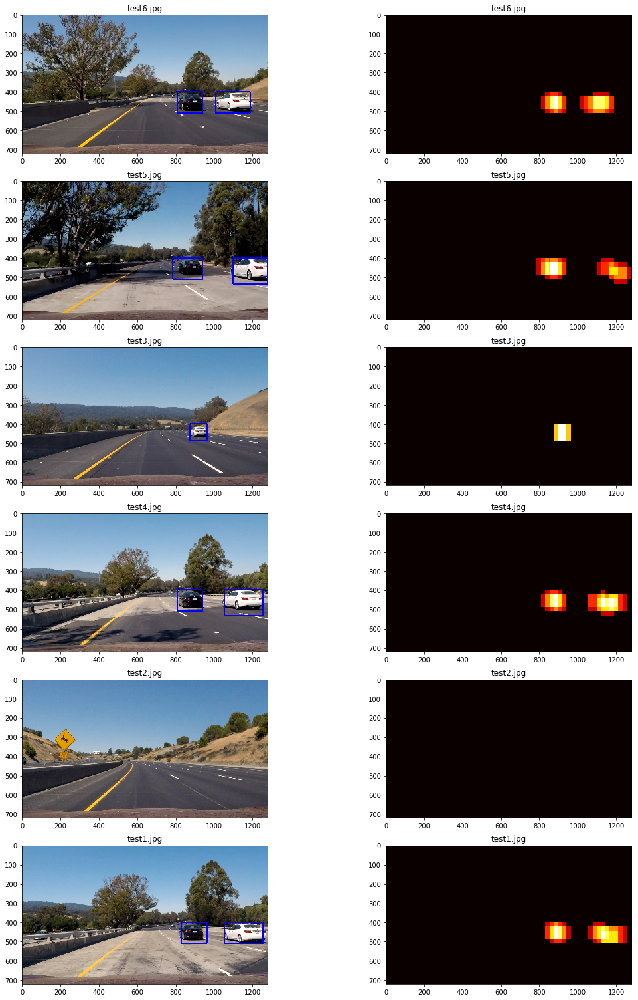

In [9]:
out_images = []
out_maps = []
ystart = 400
ystop = 656
scale = 1.4
thersh= 1
# Iterate over the test images
for img_src in example_images:
    img = mpimg.imread(img_src)
    out_img, heatmap = find_cars(img, scale)
    heatmap = appley_threshold(heatmap,thersh)
    labels = label(heatmap)
    # Draw bounding boxes a the coppy of the image
    draw_img = draw_labeled_bboxes(np.copy(img), labels)
    out_images.append(draw_img)
    out_images.append(heatmap)

fig = plt.figure(figsize=(18,36))
visualize(fig,8,2,out_images,out_titles) 

In [10]:
import pickle
from tracker import tracker
from helper_lanes import *

# Read the camera calibration result 
dist_pickle = pickle.load(open( "./camera_cal.p", "rb" ) )
mtx = dist_pickle["mtx"] 
dist = dist_pickle["dist"]

# initialise the tracker objeckt for the lane detection from SDC T1 P4
global curve_centers
curve_centers = tracker(Mywindow_width=60, Mywindow_height=144, Mymargin=60*2, My_ym=50/720, My_xm=3.7/700, Mysmooth_factor=10)

In [11]:
def process_image_ave(img):
    
    global heat_map_recent
    global index
    
    # parameters
    scale = 1.4
    thersh= 1
    
    # get heatmap from find cars
    draw_img, heat_map = find_cars(img, scale)
    
    # rest heat_map to 0 if first image came
    if index == 0:
        heat_map = np.zeros_like(img[:,:,0])
    else:
        # binary recent heatmap
        heat_map_recent[heat_map_recent > thersh] = thersh
        # add binary to current heatmap
        heat_map += heat_map_recent
        
    # appley_threshold store and save it in globle heat_map_recent 
    heat_map_recent = appley_threshold(heat_map, thersh)
    
    # get lables from the heatmap
    labeled_array, num_features = label(heat_map_recent)
    
    # draw the lanes on an undestoted image and nice head
    img_out = process_image_lanes(img,heat_map, index)
    
    # draw the bounding boxes
    img_out = draw_labeled_bboxes(img_out,(labeled_array, num_features))    
    
    # frame counter
    index += 1 
    return img_out

In [12]:
# vidoe cell
index = 0
from moviepy.editor import VideoFileClip
from IPython.display import HTML

test_output = 'P5_video_ave_S14.mp4'

#clip = VideoFileClip('test_video.mp4')
clip = VideoFileClip('project_video.mp4')
test_clip = clip.fl_image(process_image_ave)

#%time    
test_clip.write_videofile(test_output,audio=False)

[MoviePy] >>>> Building video P5_video_ave_S14.mp4
[MoviePy] Writing video P5_video_ave_S14.mp4


100%|█████████▉| 1260/1261 [3:05:20<00:08,  8.48s/it] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: P5_video_ave_S14.mp4 

